# Bird Clef 2023 Exploratory Data Analysis

## Importing Libraries

In [1]:
import os

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import librosa

from IPython.display import Audio

## Loading Data

In [2]:
DATA_DIR = './birdclef-2023/'

In [3]:
df_train = pd.read_csv(os.path.join(DATA_DIR, 'train_metadata.csv'))
df_bird_relationships = pd.read_csv(os.path.join(DATA_DIR, 'eBird_Taxonomy_v2021.csv'))

In [4]:
df_train.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg
3,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/363503,abethr1/XC363503.ogg
4,abethr1,[],"['call', 'song']",-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,4.5,https://www.xeno-canto.org/363504,abethr1/XC363504.ogg


In [5]:
df_train.shape

(16941, 12)

In [6]:
df_train.isnull().sum()

primary_label         0
secondary_labels      0
type                  0
latitude            227
longitude           227
scientific_name       0
common_name           0
author                0
license               0
rating                0
url                   0
filename              0
dtype: int64

There are 227 files with no location data.

In [7]:
df_bird_relationships.head()

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
0,1,species,ostric2,Common Ostrich,Struthio camelus,Struthioniformes,Struthionidae (Ostriches),Ostriches,NaN
1,6,species,ostric3,Somali Ostrich,Struthio molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN
2,7,slash,y00934,Common/Somali Ostrich,Struthio camelus/molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN
3,8,species,grerhe1,Greater Rhea,Rhea americana,Rheiformes,Rheidae (Rheas),Rheas,NaN
4,14,species,lesrhe2,Lesser Rhea,Rhea pennata,Rheiformes,Rheidae (Rheas),NaN,NaN


In [8]:
df_bird_relationships.shape

(16753, 9)

In [9]:
df_bird_relationships.isnull().sum()

TAXON_ORDER             0
CATEGORY                0
SPECIES_CODE            0
PRIMARY_COM_NAME        0
SCI_NAME                0
ORDER1                  2
FAMILY                 13
SPECIES_GROUP       16537
REPORT_AS           12877
dtype: int64

## Exploring the bird species metadata

### Primary Labels

In [10]:
df_train.primary_label.nunique()

264

In [11]:
def get_bird_names(bird_code: str):
    return df_bird_relationships[df_bird_relationships.SPECIES_CODE == bird_code].PRIMARY_COM_NAME.values[0]

Bird species with the most recordings

In [12]:
for bird_code in df_train.primary_label.value_counts().head(10).index:
    print(get_bird_names(bird_code))

Barn Swallow
Willow Warbler
Thrush Nightingale
Western Yellow Wagtail
Common Sandpiper
Wood Sandpiper
Common Buzzard
European Bee-eater
Eurasian Hoopoe
Common House-Martin


Bird species with the least recordings

In [13]:
for bird_code in df_train.primary_label.value_counts().tail(10).index:
    print(get_bird_names(bird_code))

Red-headed Bluebill
Goliath Heron
Brown-capped Weaver
Brown-tailed Chat
Yellow-billed Stork
Long-tailed Cormorant
White-crested Turaco
White-headed Sawwing
African Pygmy Kingfisher
Crested Francolin


Distribution of top 75 primary labels

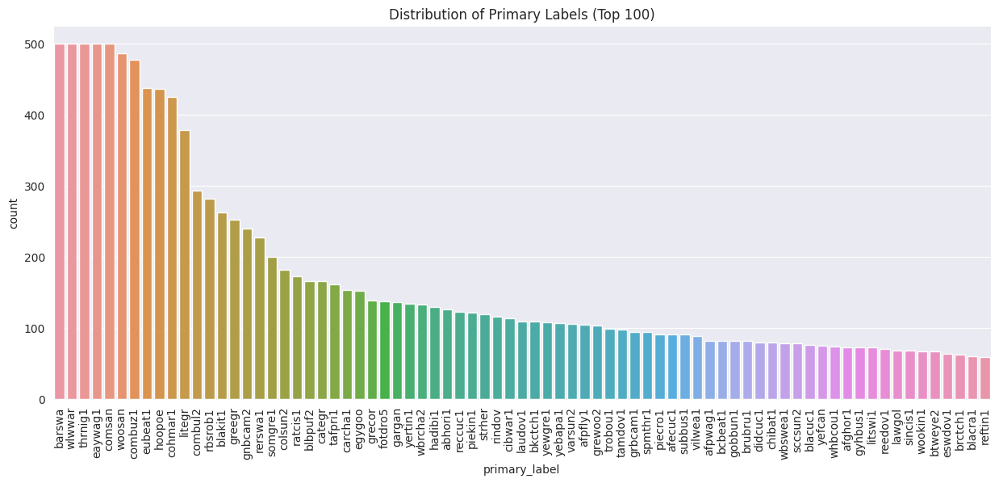

In [14]:
plt.figure(figsize=(15, 6))
sns.countplot(data=df_train, x='primary_label', order=df_train['primary_label'].value_counts().iloc[:75].index)
plt.title('Distribution of Primary Labels (Top 100)')
plt.xticks(rotation=90)
plt.show()

Distribution of bottom 75 primary labels

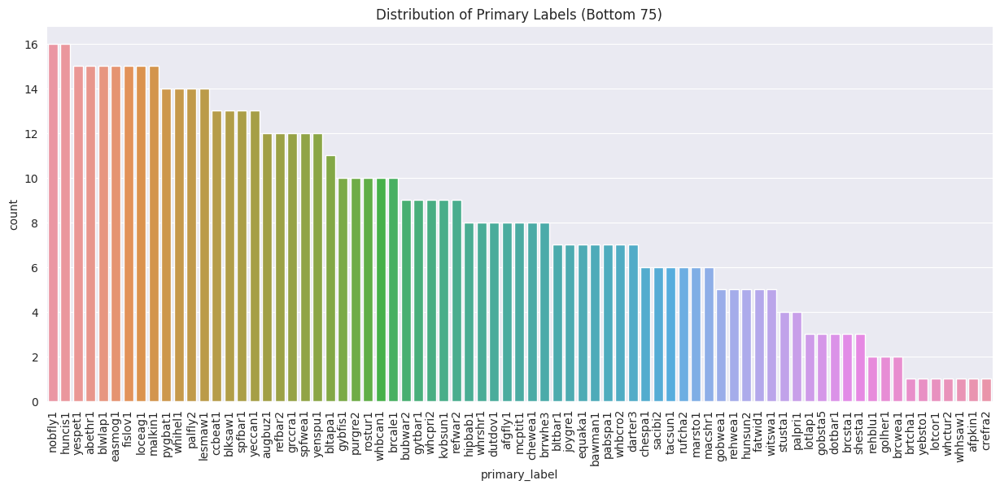

In [15]:
plt.figure(figsize=(15, 6))
sns.countplot(data=df_train, x='primary_label', order=df_train['primary_label'].value_counts().iloc[-75:].index)
plt.title('Distribution of Primary Labels (Bottom 75)')
plt.xticks(rotation=90)
plt.show()

### Ratings

Bird species with the better audio ratings

In [16]:
df_train.groupby('primary_label')['rating'].mean().sort_values(ascending=False).head(10)

primary_label
palpri1    5.000000
whhsaw1    5.000000
brcsta1    4.833333
shesta1    4.666667
tacsun1    4.666667
somtit4    4.636364
rufcha2    4.583333
mcptit1    4.500000
lotcor1    4.500000
whctur2    4.500000
Name: rating, dtype: float64

Distribution of ratings

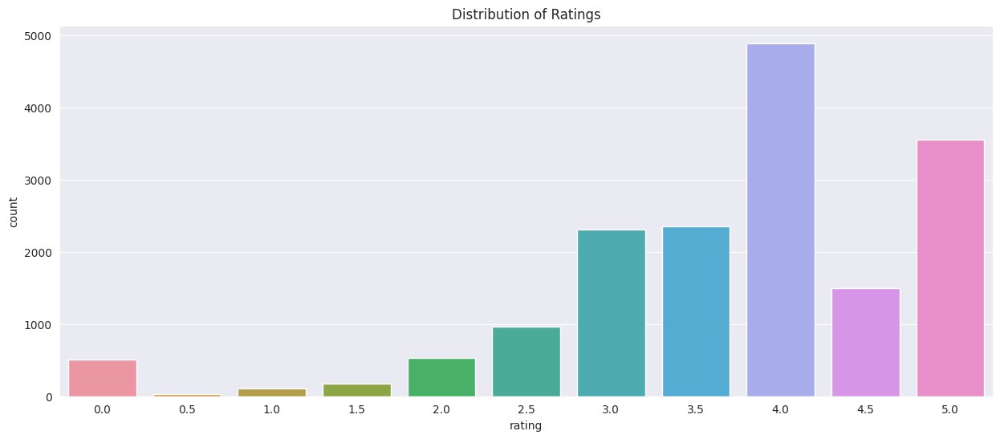

In [17]:
plt.figure(figsize=(15, 6))
sns.countplot(data=df_train, x='rating')
plt.title('Distribution of Ratings')
plt.show()

### Birds distribution

In [18]:
# create scatter mapbox plot for latitudes and longitudes in df_train
fig = px.scatter_mapbox(df_train, lat="latitude", lon="longitude", hover_name="filename", hover_data=["common_name", "author", "rating"],
                        color_discrete_sequence=px.colors.qualitative.Antique, zoom=3, height=300)
fig.update_layout(mapbox_style="open-street-map", autosize=True, width=1500, height=600)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_layout(title_text="Bird species distribution")
fig.show()

In [19]:
# Create a density mapbox plot for latitudes and longitudes in df_train
fig = px.density_mapbox(df_train, lat="latitude", lon="longitude",radius=10, zoom=2)
fig.update_layout(mapbox_style="stamen-terrain", width=1500, height=600)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_layout(title_text="Bird species density distribution")
fig.show()

## Exploring the bird species audio files

In [22]:
def plot_audio(audio_path):

    samples, sample_rate = librosa.load(audio_path)

    plt.figure(figsize=(15, 6))
    plt.title('Wave plot')
    librosa.display.waveshow(samples, sr=sample_rate)


    spectrogram = librosa.stft(samples)
    spectrogram_db = librosa.amplitude_to_db(abs(spectrogram))

    plt.figure(figsize=(15, 6))
    plt.title('Spectrogram')
    librosa.display.specshow(spectrogram_db, sr=sample_rate, x_axis='time', y_axis='hz')
    plt.colorbar(format='%+2.0f dB')

    mel_spectrogram = librosa.feature.melspectrogram(y=samples, sr=sample_rate)

    plt.figure(figsize=(15, 6))
    plt.title('Mel Spectrogram')
    librosa.display.specshow(librosa.power_to_db(mel_spectrogram, ref=np.max), sr=sample_rate, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')

    chroma_spectrogram = librosa.feature.chroma_stft(y=samples, sr=sample_rate)

    plt.figure(figsize=(15, 6))
    plt.title('Chroma Spectrogram')
    librosa.display.specshow(chroma_spectrogram, sr=sample_rate, x_axis='time', y_axis='chroma')
    plt.colorbar()

    mfccs = librosa.feature.mfcc(y=samples, sr=sample_rate)

    plt.figure(figsize=(15, 6))
    plt.title('MFCCs')
    librosa.display.specshow(mfccs, sr=sample_rate, x_axis='time')
    plt.colorbar()

    display(Audio(samples, rate=sample_rate))
    plt.show()

### For bird species: barswa

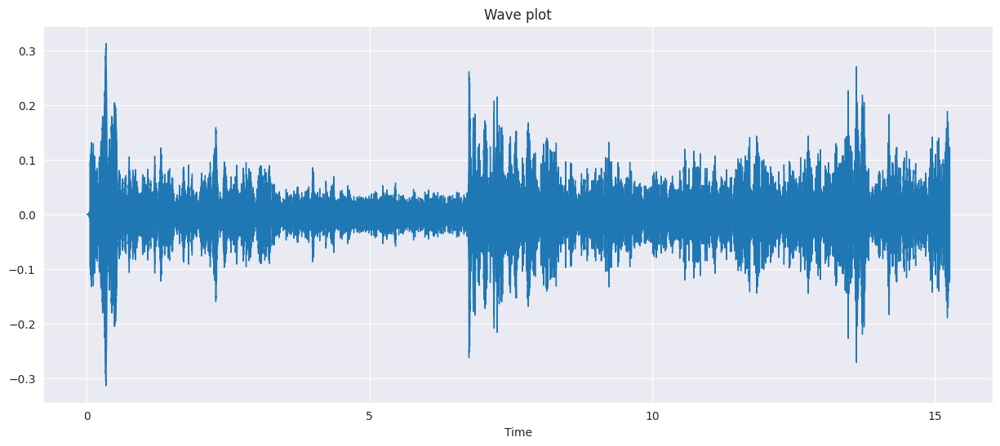

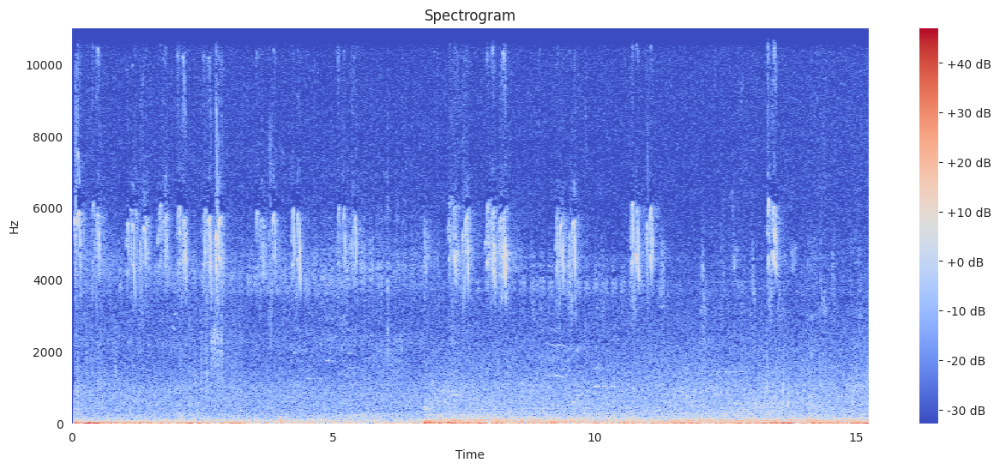

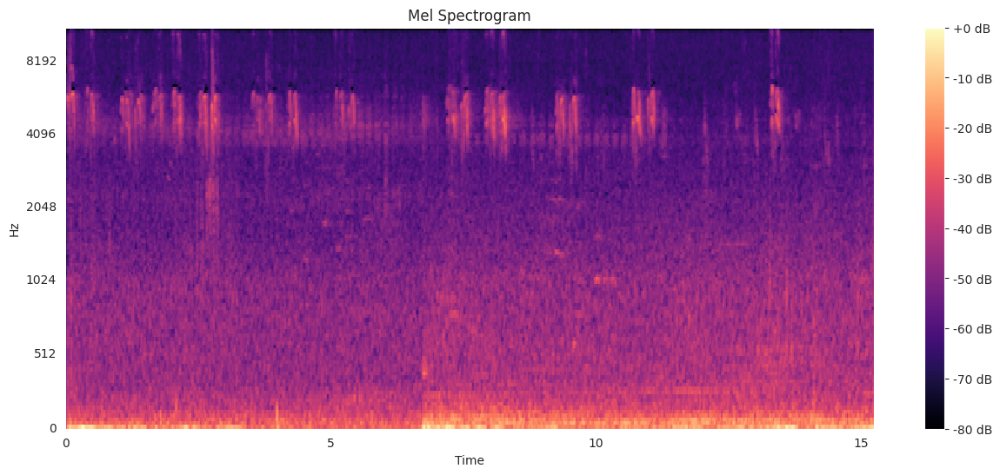

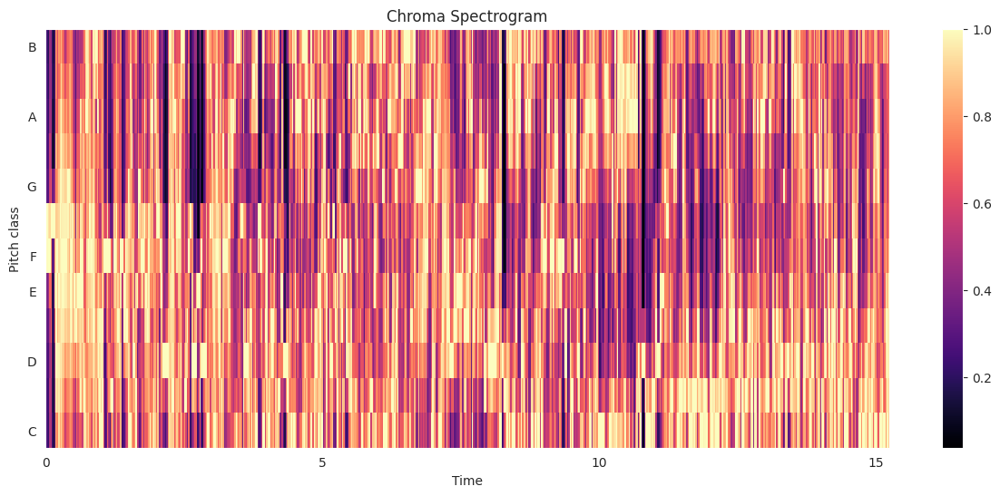

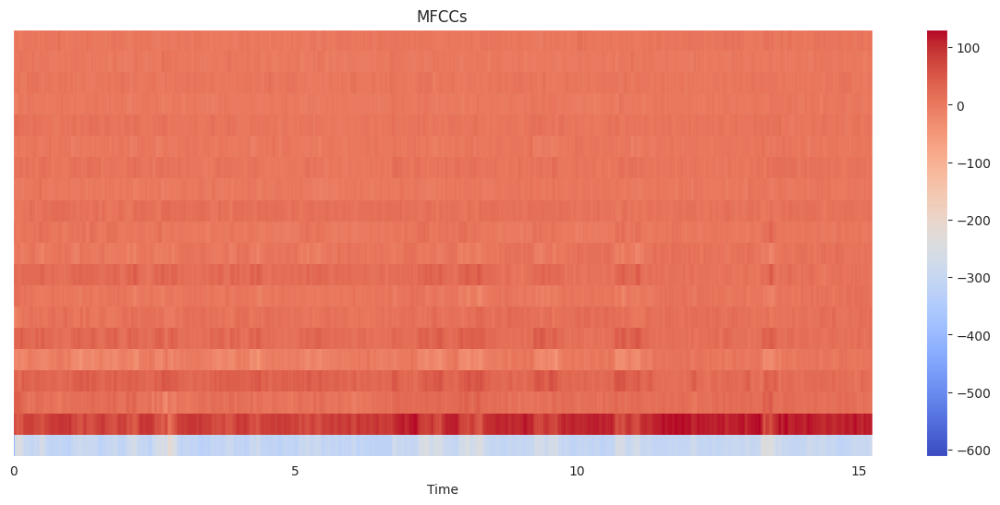

In [23]:
bird_code = 'barswa'
audio_path = df_train[df_train.primary_label == bird_code].sample(1).filename.values[0]

plot_audio(os.path.join(DATA_DIR, 'train_audio', audio_path))

For bird species: afrgos1

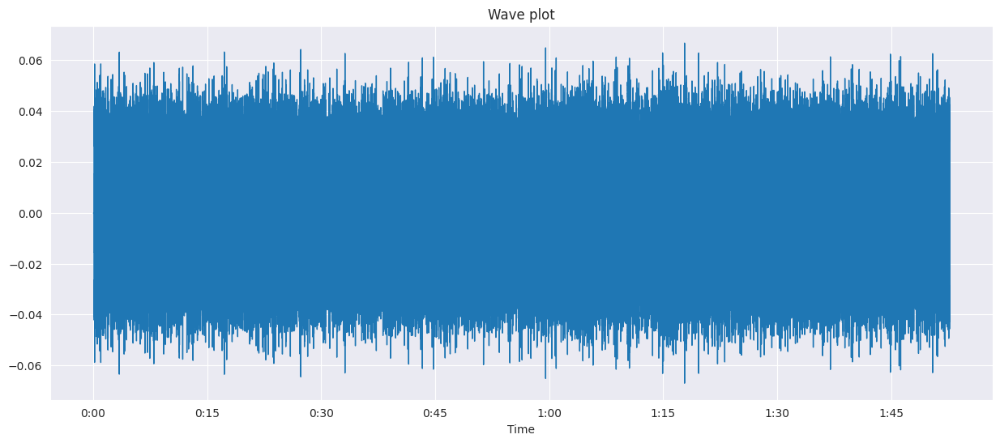

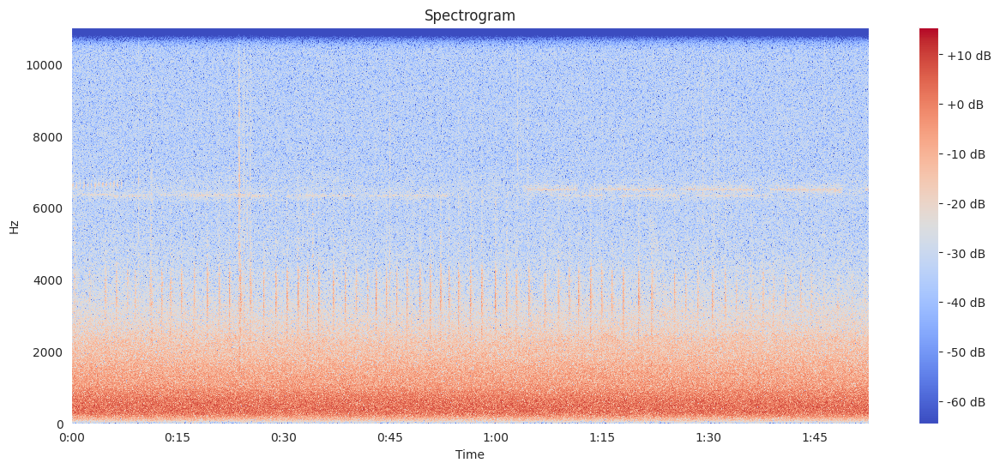

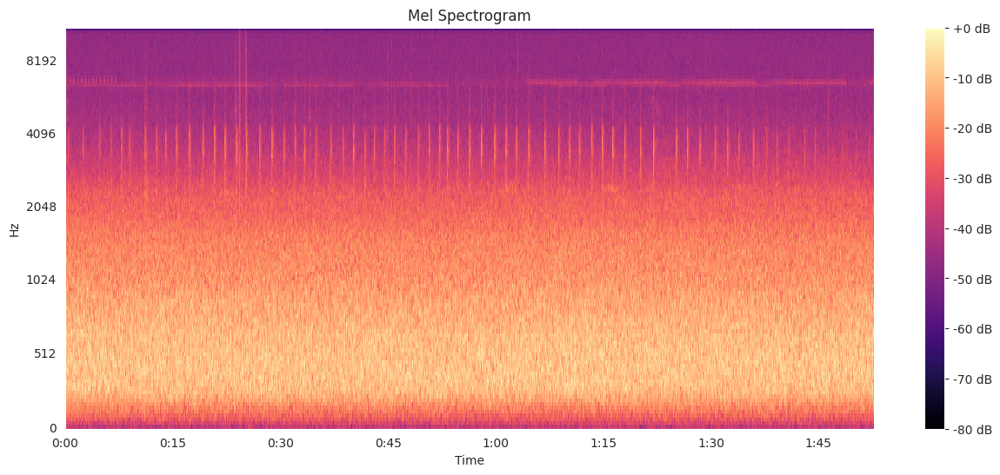

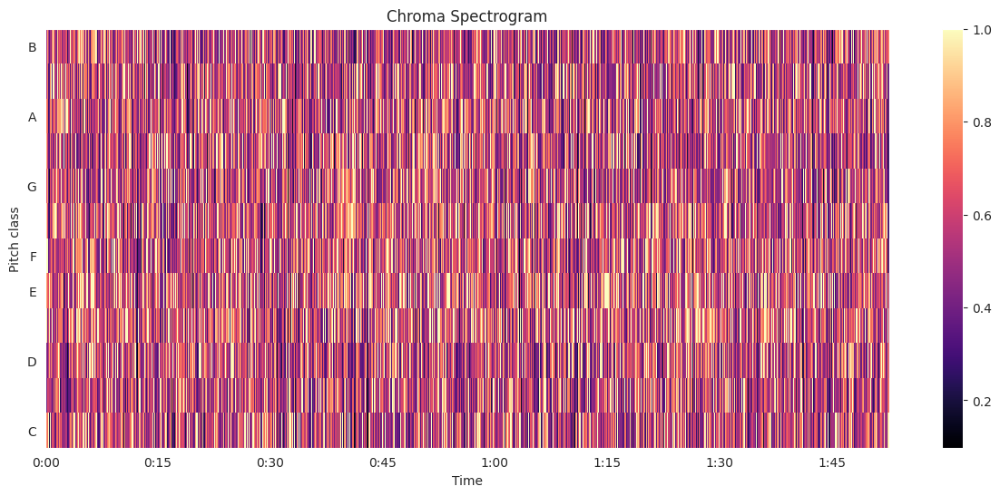

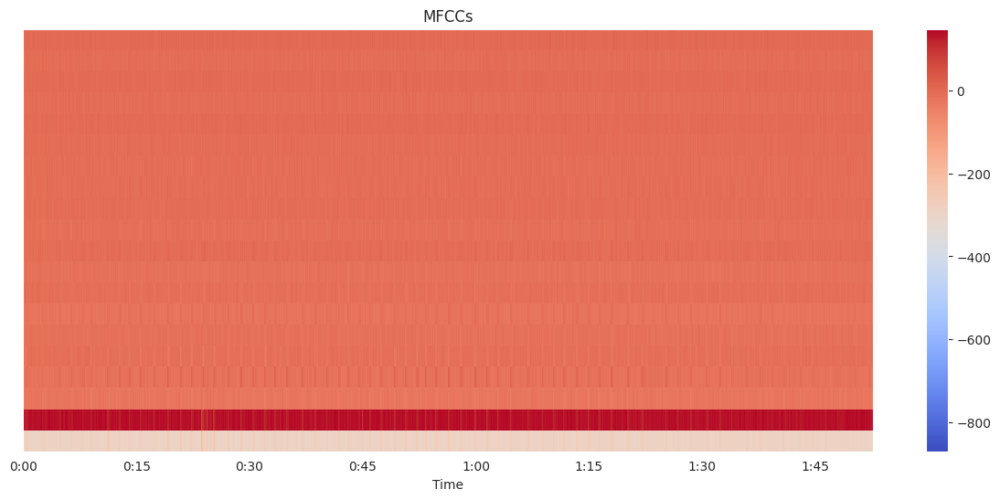

In [25]:
bird_code = 'afrgos1'
audio_path = df_train[df_train.primary_label == bird_code].sample(1).filename.values[0]
plot_audio(os.path.join(DATA_DIR, 'train_audio', audio_path))